# Principal Component Analysis

PCA is run and the drivers of variance visualized.

In [1]:
import anndata as ad

adata = ad.read_h5ad("/Users/kpax/Documents/aep/study/MSC/lab/PPMI_Project_133_RNASeq/ppmi_adata.h5ad")


A module that was compiled using NumPy 1.x cannot be run in
NumPy 2.2.4 as it may crash. To support both 1.x and 2.x
versions of NumPy, modules must be compiled with NumPy 2.0.
Some module may need to rebuild instead e.g. with 'pybind11>=2.12'.

If you are a user of the module, the easiest solution will be to
downgrade to 'numpy<2' or try to upgrade the affected module.
We expect that some modules will need time to support NumPy 2.

Traceback (most recent call last):  File "<frozen runpy>", line 198, in _run_module_as_main
  File "<frozen runpy>", line 88, in _run_code
  File "/Users/kpax/Documents/aep/study/MSC/lab/ppmi-wip/ppmi-env/lib/python3.12/site-packages/ipykernel_launcher.py", line 18, in <module>
    app.launch_new_instance()
  File "/Users/kpax/Documents/aep/study/MSC/lab/ppmi-wip/ppmi-env/lib/python3.12/site-packages/traitlets/config/application.py", line 1075, in launch_instance
    app.start()
  File "/Users/kpax/Documents/aep/study/MSC/lab/ppmi-wip/ppmi-env/lib/python3.

## Groups Overview

/var/folders/qb/t7qv2b9n33n2xzbjvg_dk_4c0000gn/T/ipykernel_14703/2786546067.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  patient_counts = adata.obs.groupby(['Gender', 'Diagnosis'])['Patient'].nunique().unstack()


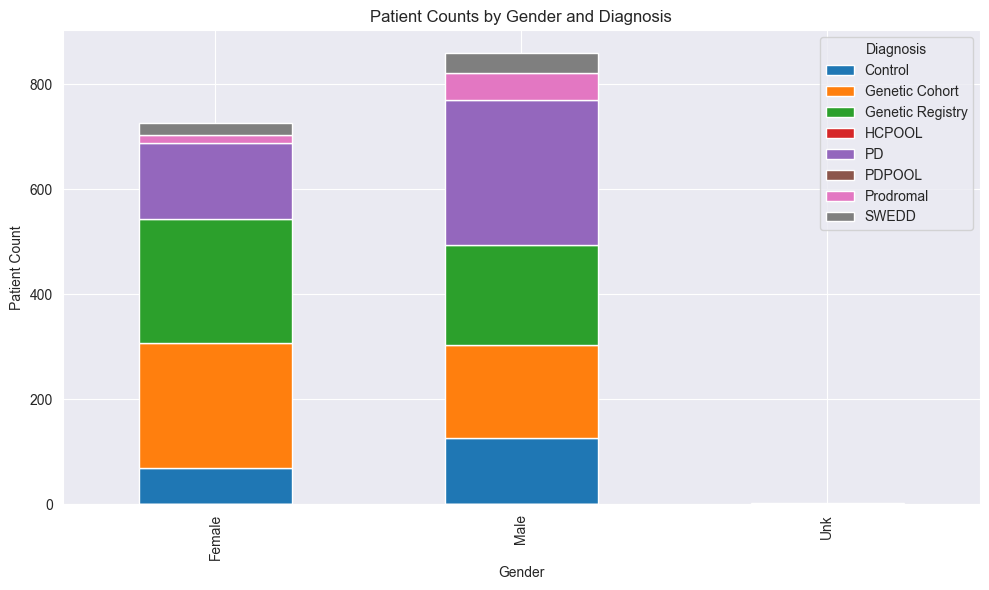

In [2]:
import matplotlib.pyplot as plt

patient_counts = adata.obs.groupby(['Gender', 'Diagnosis'])['Patient'].nunique().unstack()

patient_counts.plot(kind='bar', stacked=True, figsize=(10, 6))

plt.title('Patient Counts by Gender and Diagnosis')
plt.xlabel('Gender')
plt.ylabel('Patient Count')
plt.legend(title='Diagnosis')
plt.tight_layout()
plt.show()

/var/folders/qb/t7qv2b9n33n2xzbjvg_dk_4c0000gn/T/ipykernel_14703/3905613840.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  patient_counts = adata.obs.groupby(['Gender', 'Age_Group'])['Patient'].nunique().unstack()


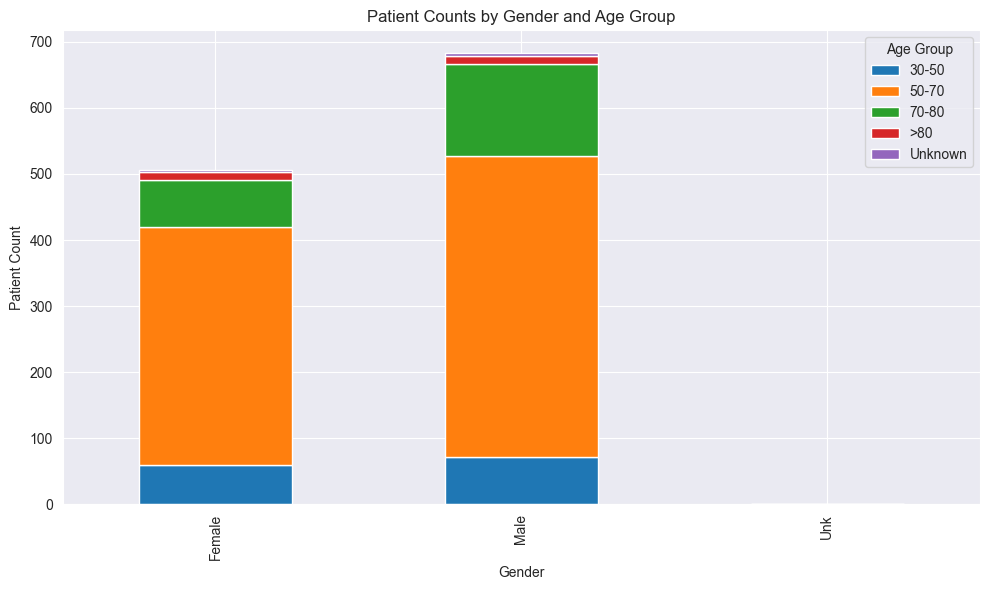

In [3]:
import matplotlib.pyplot as plt

patient_counts = adata.obs.groupby(['Gender', 'Age_Group'])['Patient'].nunique().unstack()

patient_counts.plot(kind='bar', stacked=True, figsize=(10, 6))

plt.title('Patient Counts by Gender and Age Group')
plt.xlabel('Gender')
plt.ylabel('Patient Count')
plt.legend(title='Age Group')
plt.tight_layout()
plt.show()

/var/folders/qb/t7qv2b9n33n2xzbjvg_dk_4c0000gn/T/ipykernel_10415/627628471.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  patient_counts = adata.obs.groupby(['Gender', 'Genetic_Group'])['Patient'].nunique().unstack()


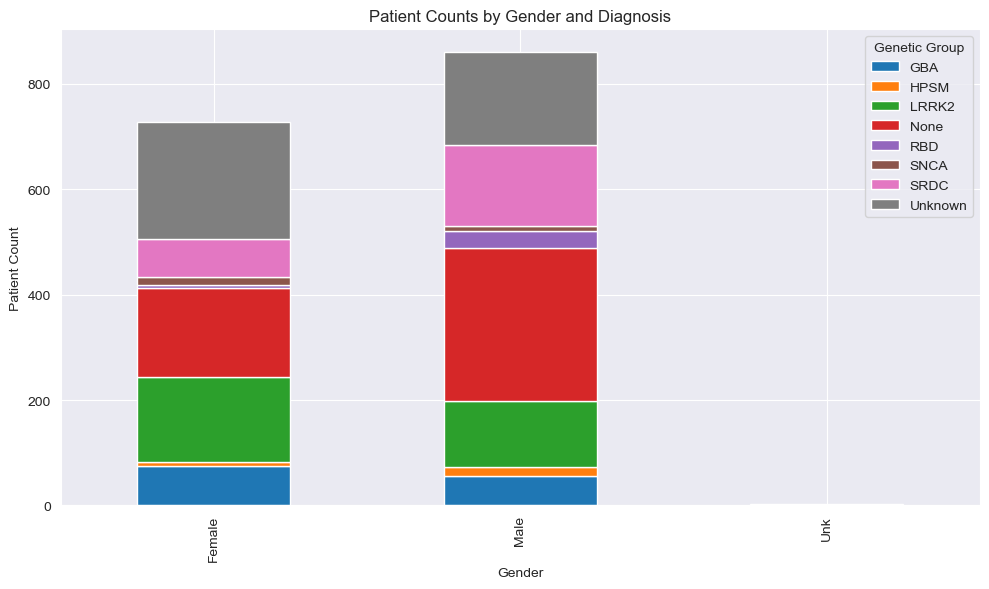

In [24]:
import matplotlib.pyplot as plt

patient_counts = adata.obs.groupby(['Gender', 'Genetic_Group'])['Patient'].nunique().unstack()

patient_counts.plot(kind='bar', stacked=True, figsize=(10, 6))

plt.title('Patient Counts by Gender and Diagnosis')
plt.xlabel('Gender')
plt.ylabel('Patient Count')
plt.legend(title='Genetic Group')
plt.tight_layout()
plt.show()

### PCA based on Diagnosis

In [2]:
import scanpy as sc
import seaborn as sns
import matplotlib.pyplot as plt

adata_filtered = adata[adata.obs['Diagnosis'].isin(['PD', 'Control'])]

sc.tl.pca(adata_filtered, layer='log2_cpm', n_comps=5, svd_solver='arpack')
# sc.pp.scale(adata)
import pandas as pd
pcs_df = pd.DataFrame(
    adata_filtered.obsm['X_pca'][:, :5],
    columns=[f'PC{i+1}' for i in range(5)],
    index=adata_filtered.obs_names
)
pcs_df['Diagnosis'] = adata_filtered.obs['Diagnosis']
pcs_df['Gender'] = adata_filtered.obs['Gender']
pcs_df['Genetic_Group'] = adata_filtered.obs['Genetic_Group']
pcs_df['Age_Group'] = adata_filtered.obs['Age_Group']
pcs_df['Phase'] = adata_filtered.obs['Phase']
pcs_df['IR'] = adata_filtered.obs['IR']
pcs_df['Visit'] = adata_filtered.obs['Visit']

/Users/kpax/Documents/aep/study/MSC/lab/ppmi-wip/ppmi-env/lib/python3.12/site-packages/scanpy/preprocessing/_pca/__init__.py:379: ImplicitModificationWarning: Setting element `.obsm['X_pca']` of view, initializing view as actual.
  adata.obsm[key_obsm] = X_pca


<Axes: xlabel='PC1', ylabel='PC2'>

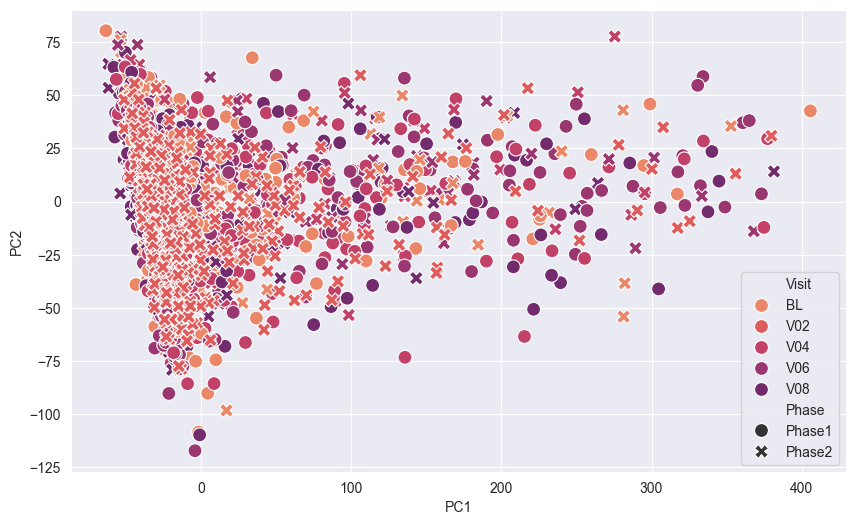

In [10]:
plt.figure(figsize=(10, 6))
sns.scatterplot(
    data=pcs_df,
    x='PC1',
    y='PC2',
    hue='Visit',  # Color by Visit
    style='Phase',  # Different markers for Phase
    s=100,  # Marker size
    palette='flare',  # Color palette for Visit
    markers=True,  # Different shapes for Phase
)

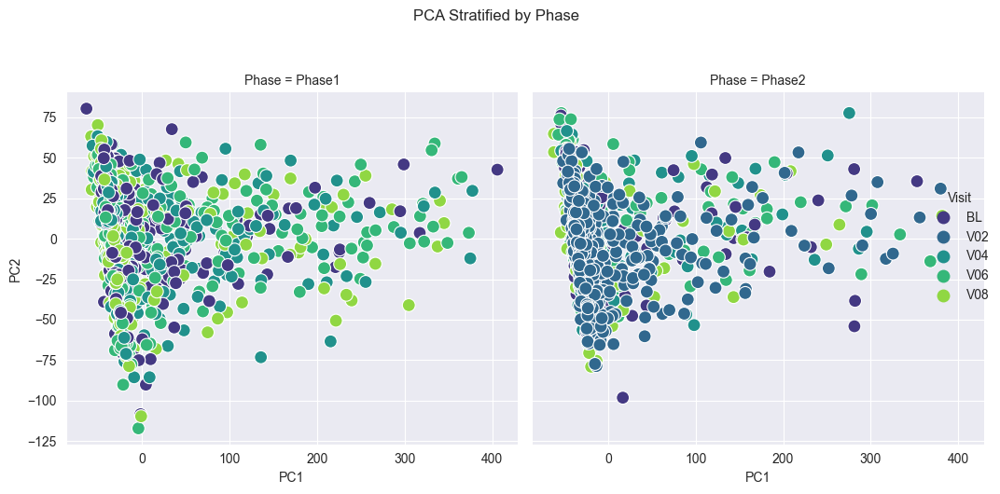

In [5]:
g = sns.relplot(
    data=pcs_df,
    x='PC1',
    y='PC2',
    hue='Visit',
    col='Phase',  # Separate subplots per Phase
    palette='viridis',
    height=5,
    aspect=1,
    s=100,
)
g.fig.suptitle('PCA Stratified by Phase', y=1.05)
plt.tight_layout()
plt.show()

/Users/kpax/Documents/aep/study/MSC/lab/ppmi-wip/ppmi-env/lib/python3.12/site-packages/scanpy/tools/_tsne.py:184: ImplicitModificationWarning: Setting element `.obsm['X_tsne']` of view, initializing view as actual.
  adata.obsm[key_obsm] = X_tsne  # annotate samples with tSNE coordinates


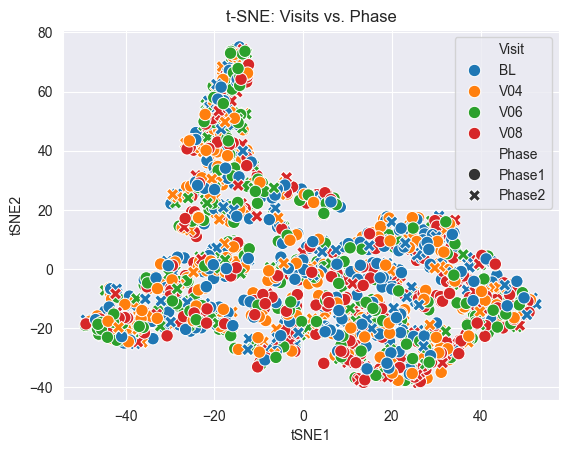

In [9]:
# Compute t-SNE (often faster than UMAP for small/medium datasets)
adata_filtered_no_v02 = adata_filtered[(adata_filtered.obs['Visit'] != 'V02') & (adata_filtered.obs['Diagnosis'] == 'PD')]
sc.tl.tsne(adata_filtered_no_v02, use_rep='X_pca', n_pcs=5)  # Use PCA to speed up

# Plot (similar to UMAP)
tsne_df = pd.DataFrame(
    adata_filtered_no_v02.obsm['X_tsne'],
    columns=['tSNE1', 'tSNE2'],
    index=adata_filtered_no_v02.obs_names
)
tsne_df['Visit'] = adata_filtered_no_v02.obs['Visit']
tsne_df['Phase'] = adata_filtered_no_v02.obs['Phase']

sns.scatterplot(data=tsne_df, x='tSNE1', y='tSNE2', hue='Visit', style='Phase', s=80)
plt.title('t-SNE: Visits vs. Phase')
plt.show()

In [8]:
explained_variance_ratio = adata_filtered.uns['pca']['variance_ratio']
for i, variance in enumerate(explained_variance_ratio, start=1):
    print(f"PC{i}: {variance*100:.2f}%")

PC1: 56.88%
PC2: 8.77%
PC3: 5.15%
PC4: 2.44%
PC5: 1.78%


In [1]:
sns.pairplot(pcs_df, hue='Phase')
plt.show()


NameError: name 'sns' is not defined

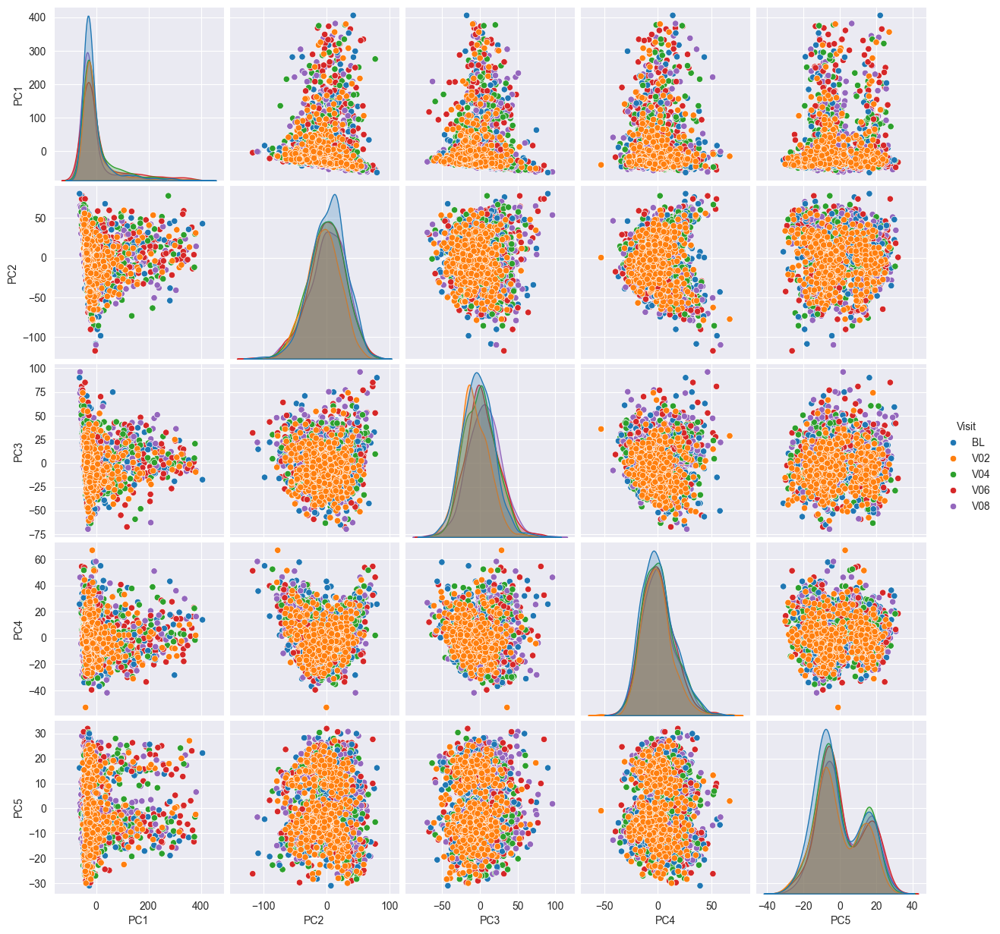

In [9]:
sns.pairplot(pcs_df, hue='Visit')
plt.show()


## PCA based on Gender

/var/folders/qb/t7qv2b9n33n2xzbjvg_dk_4c0000gn/T/ipykernel_19617/3945504237.py:7: UserWarning: Tight layout not applied. tight_layout cannot make Axes width small enough to accommodate all Axes decorations
  plt.tight_layout(rect=[0, 0.1, 1, 0.95])


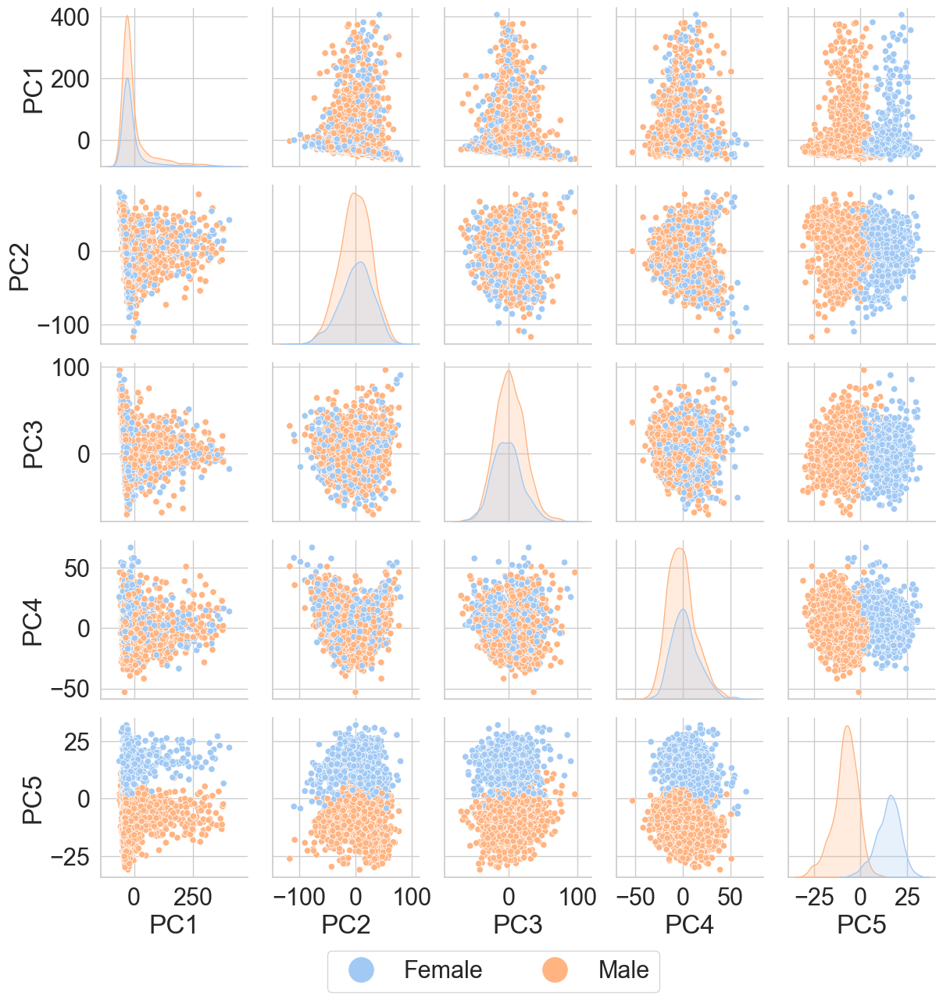

In [39]:
sns.set_theme(font_scale=2.0, style="whitegrid", palette="pastel")
g = sns.pairplot(pcs_df, hue='Gender')

handles, labels = g._legend.legend_handles, [t.get_text() for t in g._legend.texts]
g._legend.remove()
plt.legend(handles, labels, markerscale=4, loc='lower center', ncol=2, bbox_to_anchor=(-2, -0.8))
plt.tight_layout(rect=[0, 0.1, 1, 0.95])
plt.savefig("/Users/kpax/Documents/aep/study/MSC/paper/figs/3.1_pca/pca_gender.png", dpi=600, bbox_inches='tight', pad_inches=0.5)

## PCA based on Sequencing Phase

/var/folders/qb/t7qv2b9n33n2xzbjvg_dk_4c0000gn/T/ipykernel_19617/2482966599.py:7: UserWarning: Tight layout not applied. tight_layout cannot make Axes width small enough to accommodate all Axes decorations
  plt.tight_layout(rect=[0, 0.1, 1, 0.95])


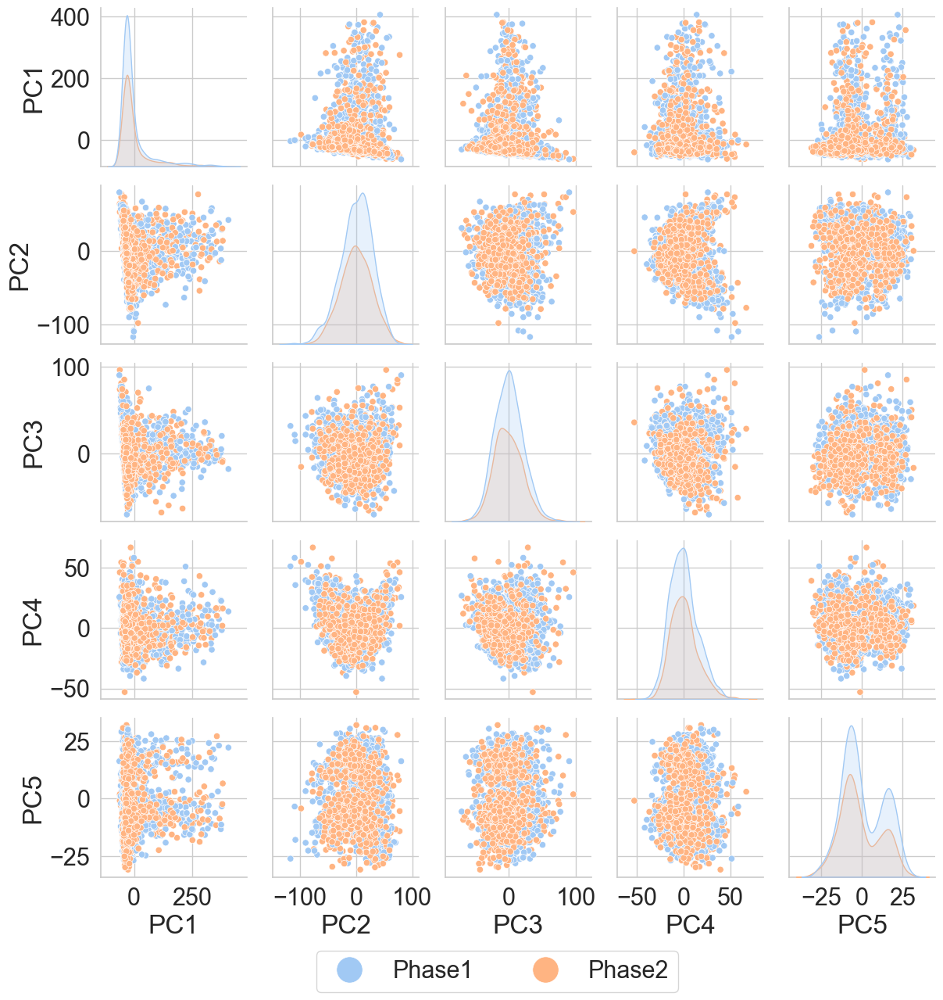

In [37]:
sns.set_theme(font_scale=2.0, style="whitegrid", palette="pastel")
g = sns.pairplot(pcs_df, hue='Phase')

handles, labels = g._legend.legend_handles, [t.get_text() for t in g._legend.texts]
g._legend.remove()
plt.legend(handles, labels, markerscale=4, loc='lower center', ncol=2, bbox_to_anchor=(-2, -0.8))
plt.tight_layout(rect=[0, 0.1, 1, 0.95])
plt.savefig("/Users/kpax/Documents/aep/study/MSC/paper/figs/3.1_pca/pca_phase.png", dpi=600, bbox_inches='tight', pad_inches=0.5)

## PCA based on Genetic Group

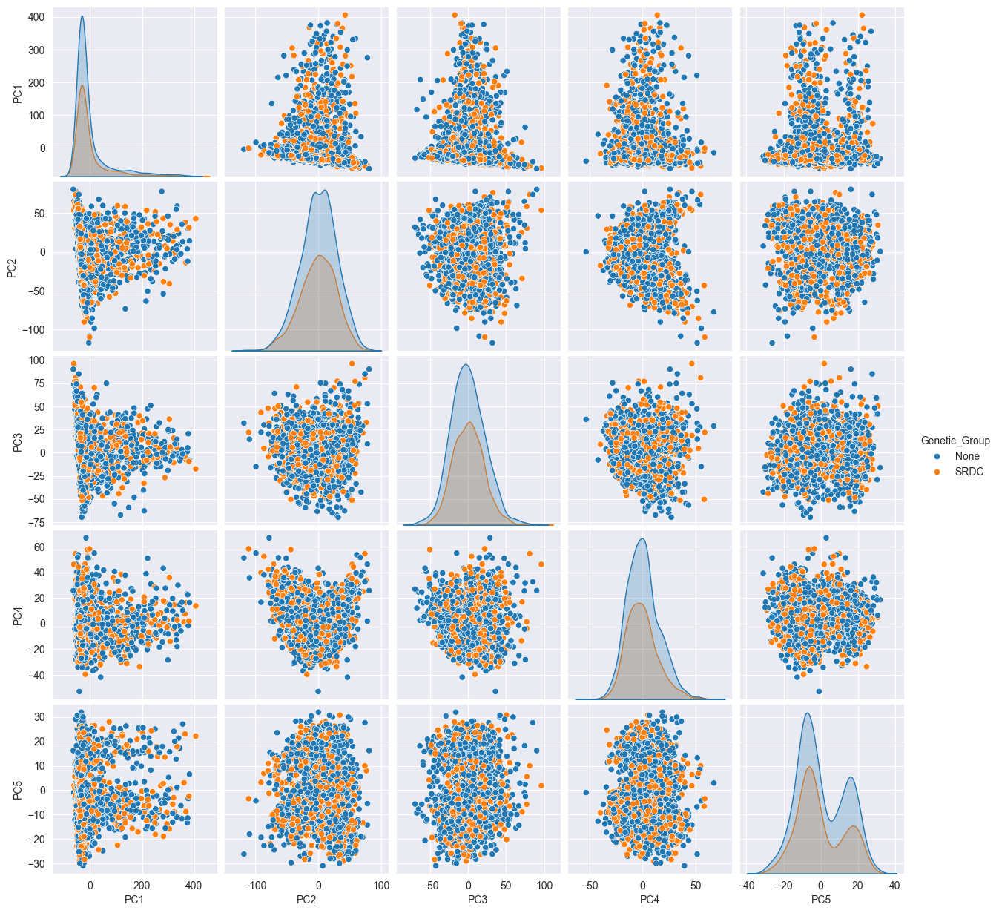

In [36]:
sns.pairplot(pcs_df, hue='Genetic_Group')
plt.show()

## PCA based on Age Group

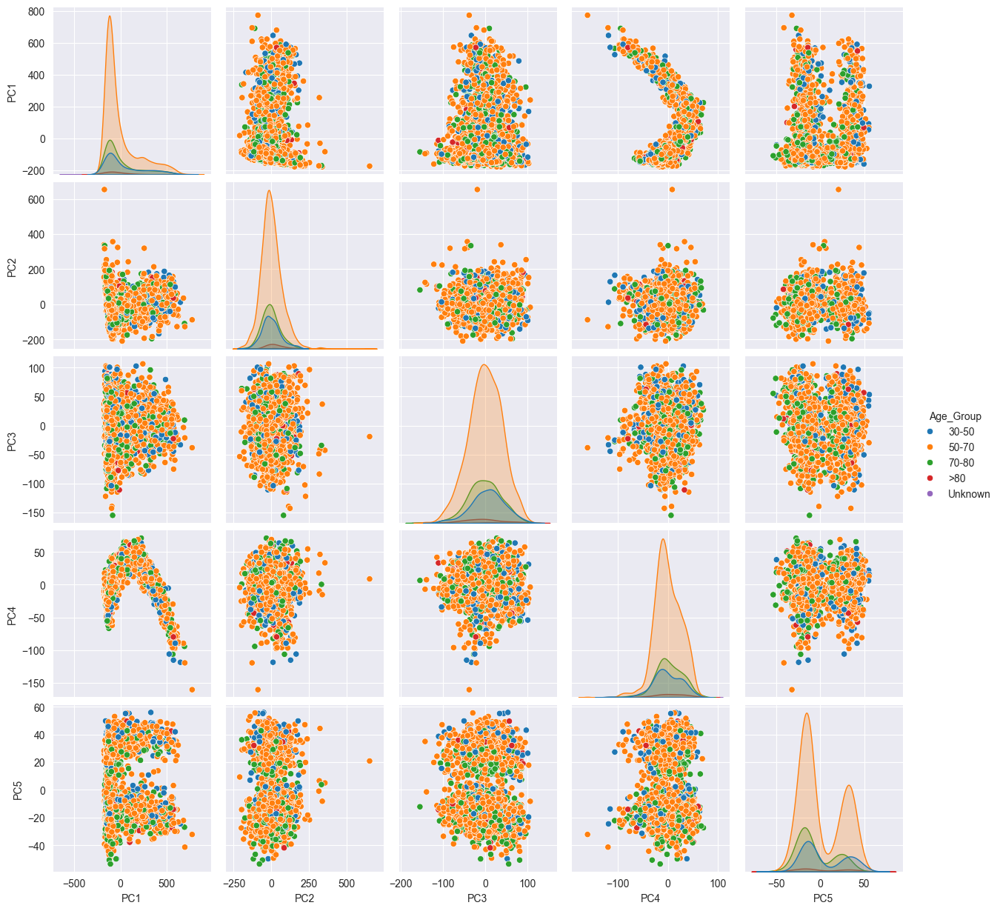

In [15]:
sns.pairplot(pcs_df, hue='Age_Group')
plt.show()

In [6]:
adata_male = adata[adata.obs['Gender'] == 'Male']
adata_female = adata[adata.obs['Gender'] == 'Female']

In [ ]:
adata_male_known_genetic_group = adata_male[~adata_male.obs['Genetic_Group'].isin(['None', 'Unknown'])]

In [19]:

adata_male_known_genetic_group = adata_male_known_genetic_group[adata_male_known_genetic_group.obs['Visit'] == 'BL']

In [20]:
import scanpy as sc
import seaborn as sns
import matplotlib.pyplot as plt

sc.tl.pca(adata_male_known_genetic_group, layer='counts_log2', n_comps=8, svd_solver='arpack')

import pandas as pd
pcs_df = pd.DataFrame(
    adata_male_known_genetic_group.obsm['X_pca'][:, :8],
    columns=[f'PC{i+1}' for i in range(8)],
    index=adata_male_known_genetic_group.obs_names
)
pcs_df['Diagnosis'] = adata_male_known_genetic_group.obs['Diagnosis']
pcs_df['Age_Group'] = adata_male_known_genetic_group.obs['Age_Group']
pcs_df['Genetic_Group'] = adata_male_known_genetic_group.obs['Genetic_Group']

/opt/anaconda3/lib/python3.12/site-packages/scanpy/preprocessing/_pca/__init__.py:379: ImplicitModificationWarning: Setting element `.obsm['X_pca']` of view, initializing view as actual.
  adata.obsm[key_obsm] = X_pca


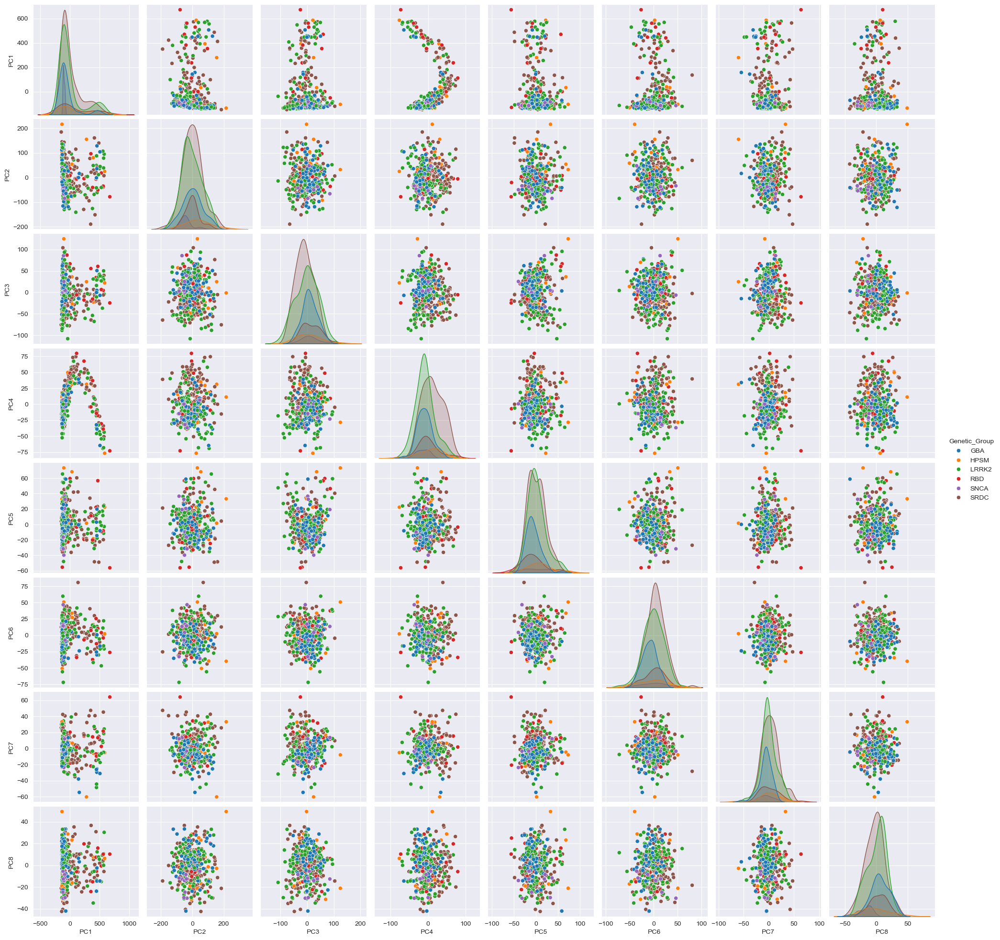

In [21]:
sns.pairplot(pcs_df, hue='Genetic_Group')
plt.show()

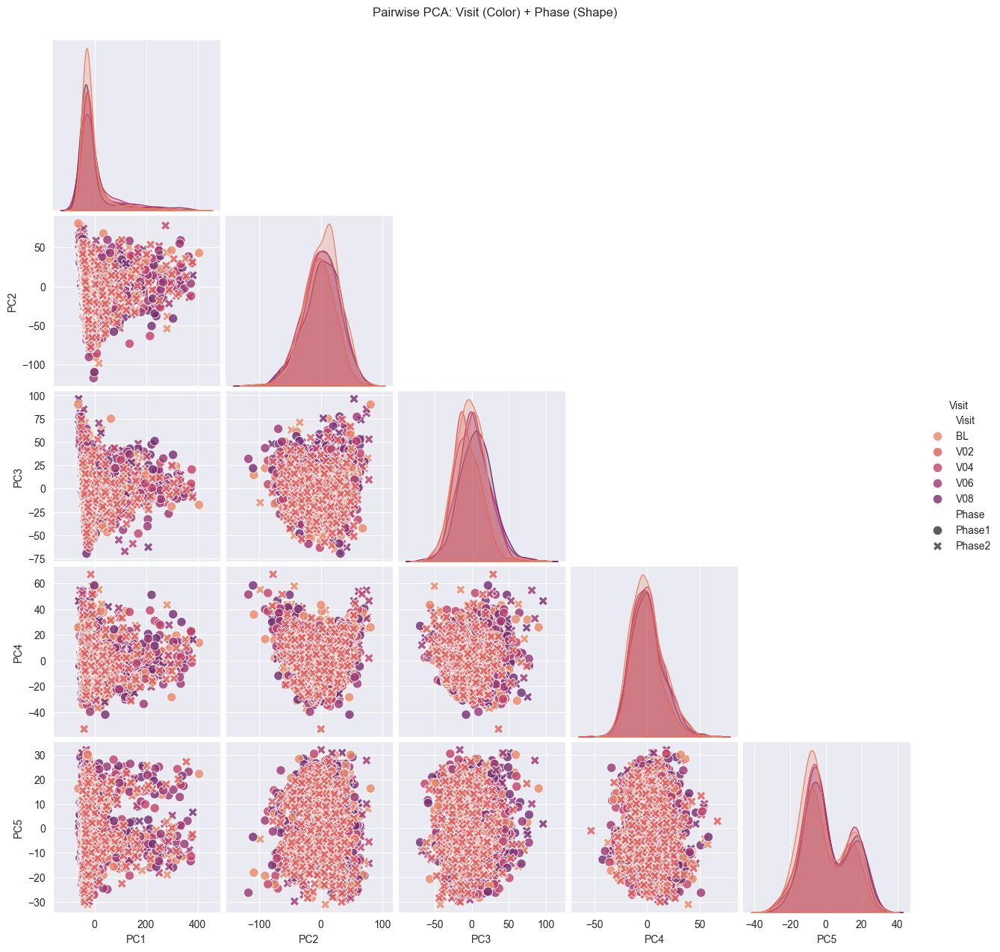

In [11]:
# Melt the DataFrame for pairplot
melted_df = pcs_df.melt(
    id_vars=['Visit', 'Phase'],
    value_vars=[f'PC{i+1}' for i in range(5)],
    var_name='PC',
    value_name='Value'
)

# Plot
sns.pairplot(
    data=pcs_df,
    vars=[f'PC{i+1}' for i in range(5)],
    hue='Visit',
    palette='flare',
    plot_kws={
        'style': pcs_df['Phase'],  # Shape by Phase
        's': 80,
        'alpha': 0.8,
        'markers': True,
    },
    corner=True,  # Show only lower triangle (no redundant plots)
)
plt.suptitle('Pairwise PCA: Visit (Color) + Phase (Shape)', y=1.02)
plt.show()

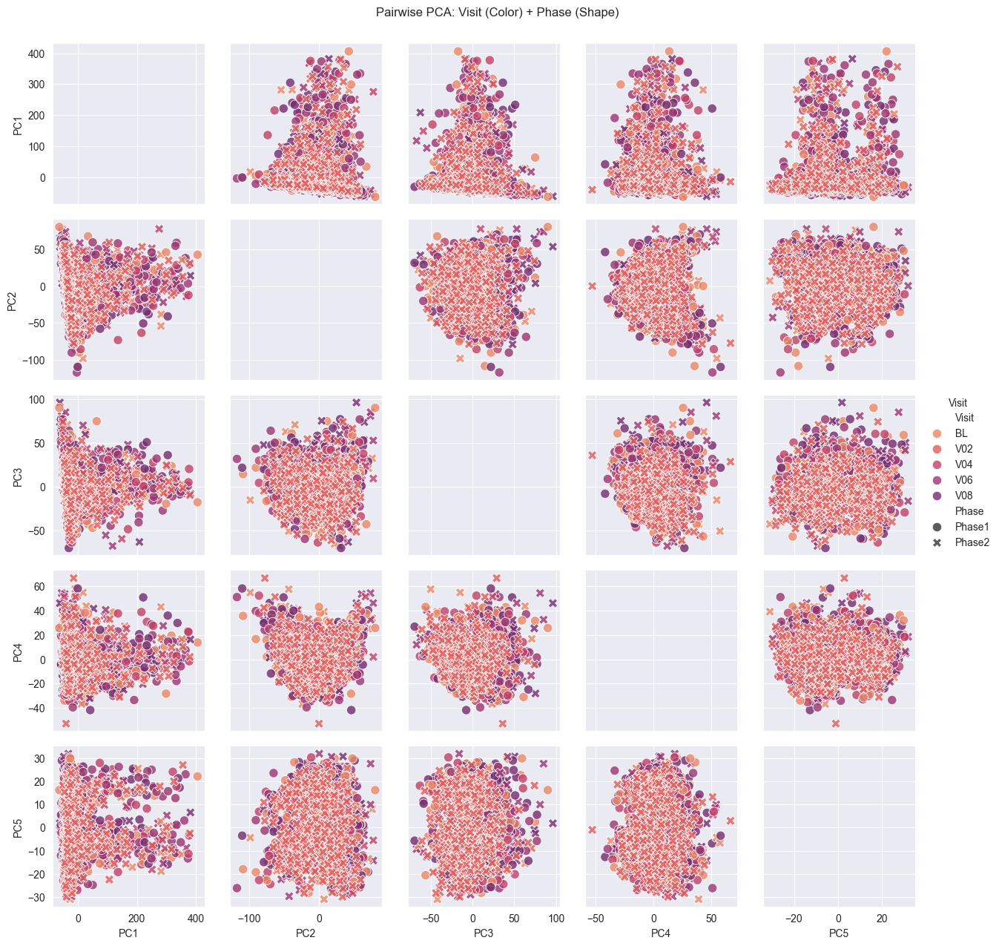

In [12]:
import seaborn as sns
import matplotlib.pyplot as plt

# Create a PairGrid for the first 5 PCs
pcs_df = pd.DataFrame(
    adata_filtered.obsm['X_pca'][:, :5],
    columns=[f'PC{i+1}' for i in range(5)],
    index=adata_filtered.obs_names
)
pcs_df['Visit'] = adata_filtered.obs['Visit']
pcs_df['Phase'] = adata_filtered.obs['Phase']

# Initialize PairGrid
g = sns.PairGrid(
    pcs_df,
    vars=[f'PC{i+1}' for i in range(5)],
    hue='Visit',
    palette='flare',
    diag_sharey=False,
)
g.map_offdiag(
    sns.scatterplot,
    style=pcs_df['Phase'],  # Shape by Phase
    s=80,
    alpha=0.8,
    markers=True,
)
g.add_legend(title='Visit')  # Add legend for Visit colors
plt.suptitle('Pairwise PCA: Visit (Color) + Phase (Shape)', y=1.02)
plt.show()

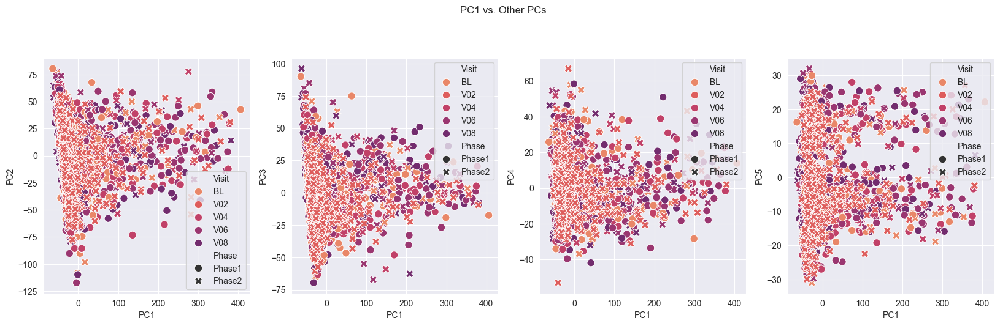

In [13]:
fig, axes = plt.subplots(1, 4, figsize=(20, 5))
for i, ax in enumerate(axes):
    sns.scatterplot(
        data=pcs_df,
        x='PC1',
        y=f'PC{i+2}',
        hue='Visit',
        style='Phase',
        palette='flare',
        s=80,
        ax=ax,
    )
plt.suptitle('PC1 vs. Other PCs', y=1.05)
plt.show()